In [1]:
%matplotlib inline
from utils import utils
import canny_edge_detector as ced
import numpy as np
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt
from myfuncs import funcs
import cv2 as cv

In [3]:
dir_name = "Images/Inputs/Set1"
imgs = utils.load_data(dir_name)

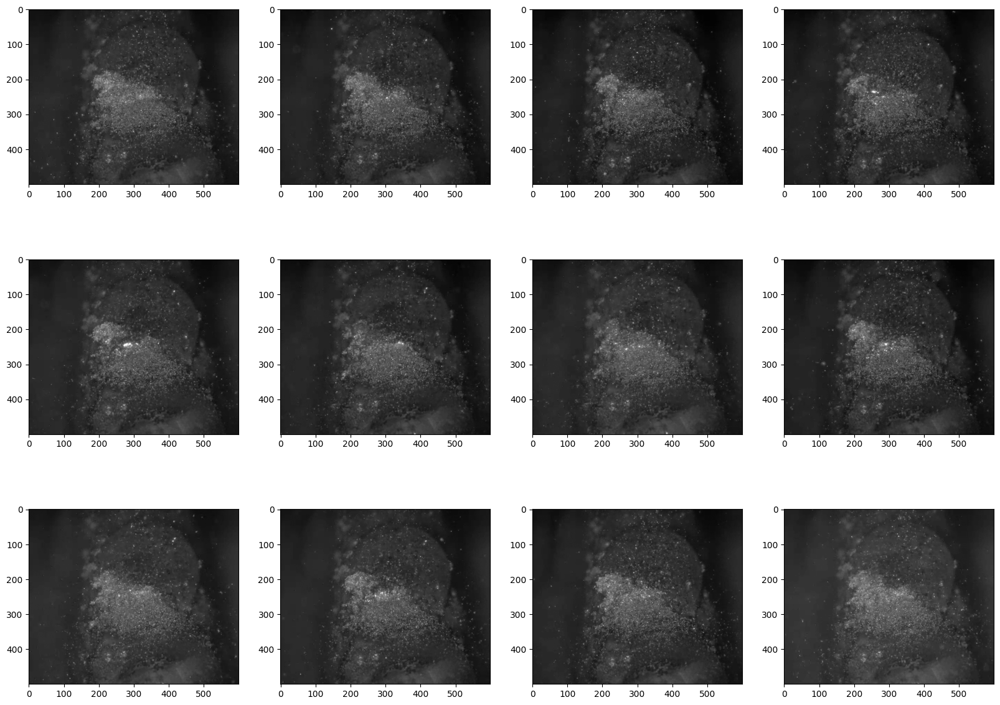

In [3]:
utils.visualize(imgs, "gray")

In [4]:
#detector = ced.cannyEdgeDetector(imgs, sigma=3, kernel_size=9, lowthreshold=0.05, highthreshold=0.22, weak_pixel=200)
#imgs_final = detector.detect()
#utils.visualize(imgs_final, 'gray')

In [4]:
detector = ced.cannyEdgeDetector(imgs, sigma=10, kernel_size=72, lowthreshold=0.08, highthreshold=0.20, weak_pixel=50)

In [5]:
imgs_final = detector.detect()

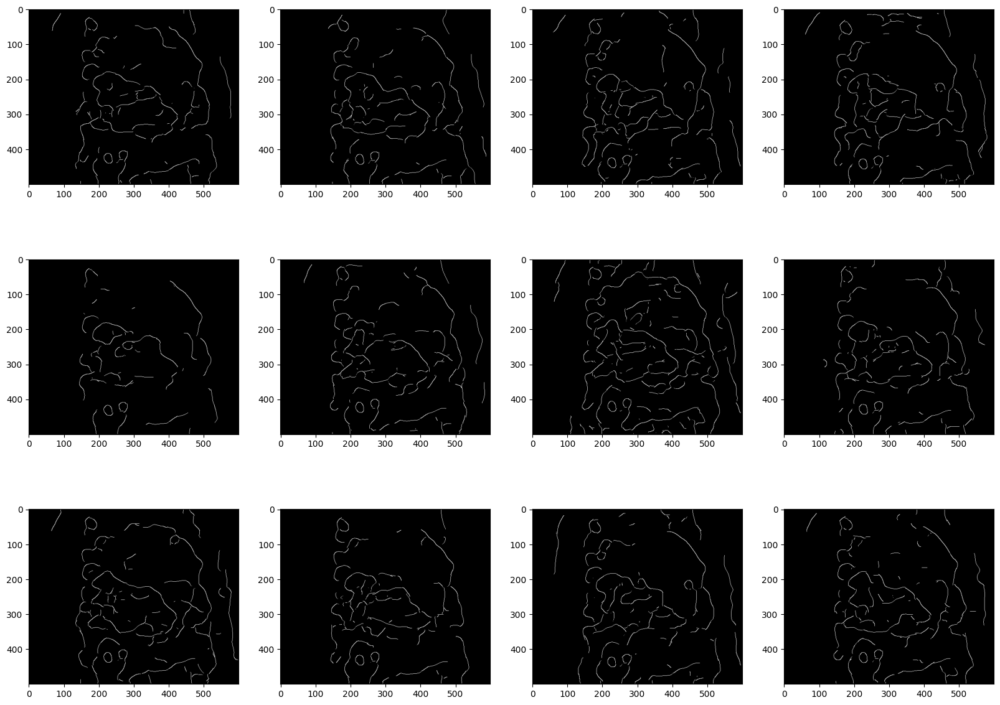

In [6]:
utils.visualize(imgs_final, 'gray')

In [7]:
im_test = Image.open("Images/Inputs/Set2/20240816-161944712534-0014.png")

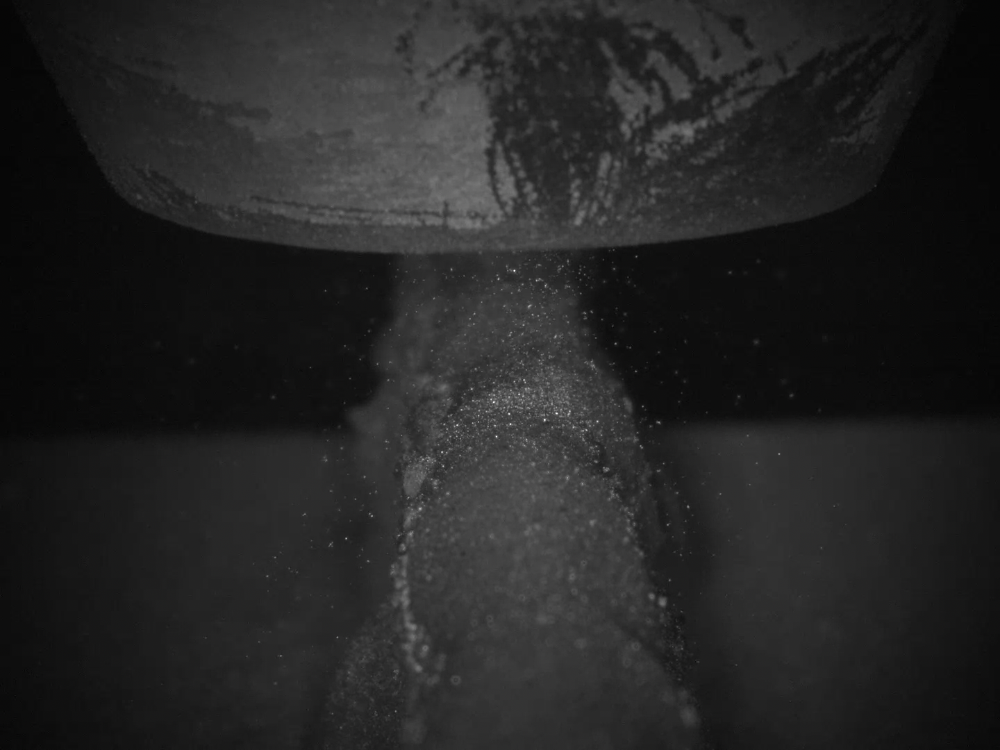

In [8]:
display(im_test)

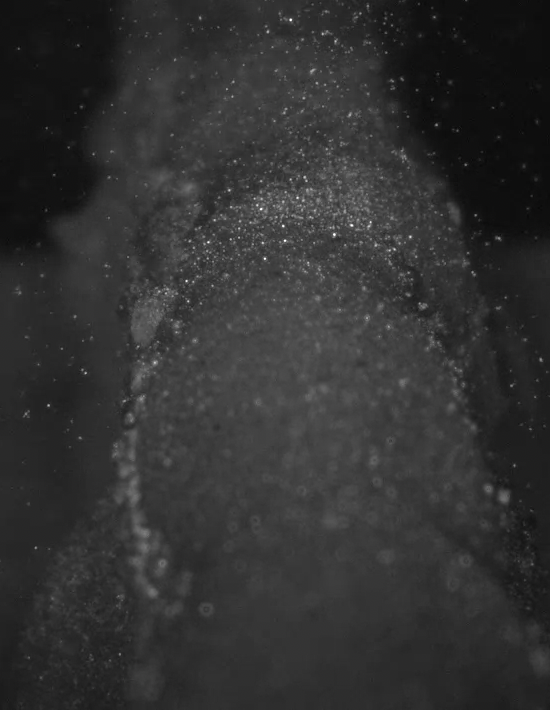

In [9]:
im_crop = im_test.crop((450,370,1000,1080)) #image was 1920x1080
display(im_crop)

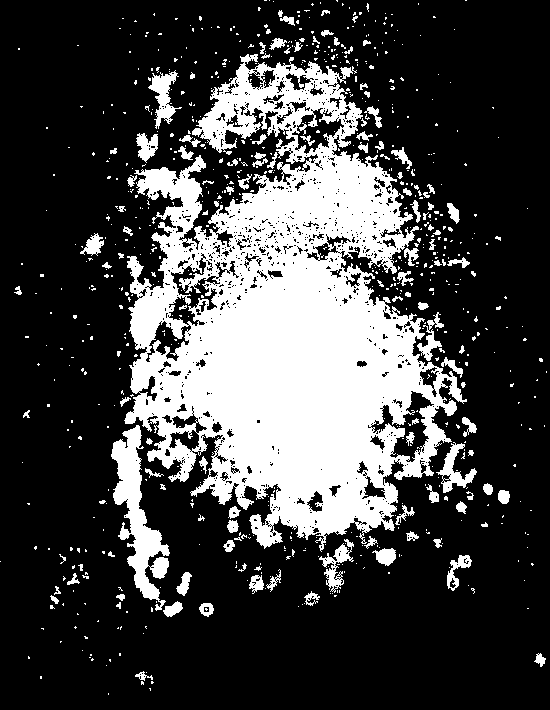

In [10]:
im_grey = im_crop.convert('L')
threshold = 60
im_thresh = im_grey.point(lambda p : 255 if p > threshold else 0)
display(im_thresh)

In [11]:
im_thresh.getpixel((0,0))

0

In [26]:
%matplotlib auto

Using matplotlib backend: <object object at 0x10f3ab460>


## Using OpenCV for video

In [54]:
vid = cv.VideoCapture('Vids/VID_topview.webm')
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter('output.mp4', fourcc, 30.0, (int(vid.get(3)), int(vid.get(4))), isColor=False)

if (vid.isOpened() == False):
    print("Error opening video stream or file")

while (vid.isOpened()):
    (ret, frame) = vid.read()
    if ret == True:
        #cv.imshow('Frame', frame)
        frame = cv.GaussianBlur(frame, (15, 15), 5)
        frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
        edge = cv.Canny(frame, 8, 14)

        out.write(edge)
        cv.imshow('Edge Detection', edge)

    else:
        break


    if cv.waitKey(25) & 0xFF == ord('q'):
        break


vid.release()
out.release()

cv.waitKey(1)
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [52]:
total_frames = vid.get(cv.CAP_PROP_FRAME_)
total_frames

0.0

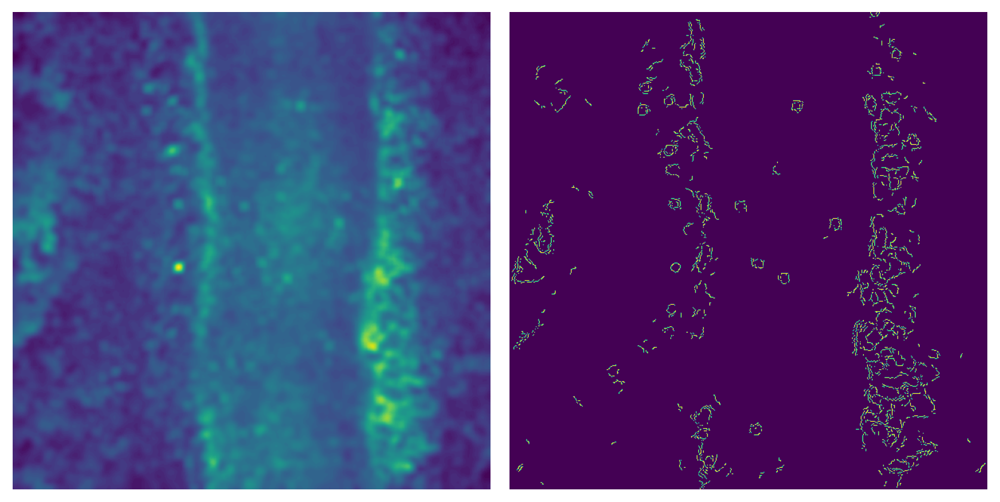

In [48]:
im1 = cv.imread('Images/Inputs/topview/VID_topview-0001.png', cv.IMREAD_GRAYSCALE)
roi1 = im1[250:850, 420:1020]
roi1_norm = cv.normalize(roi1, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
kernel = 15
sigma = 5

im1_blur = cv.GaussianBlur(roi1_norm, (kernel,kernel), sigma)
edge1 = cv.Canny(im1_blur, 8, 14)
funcs.comparer_duo(
    #roi_norm,
    im1_blur, 
    edge1,
        )


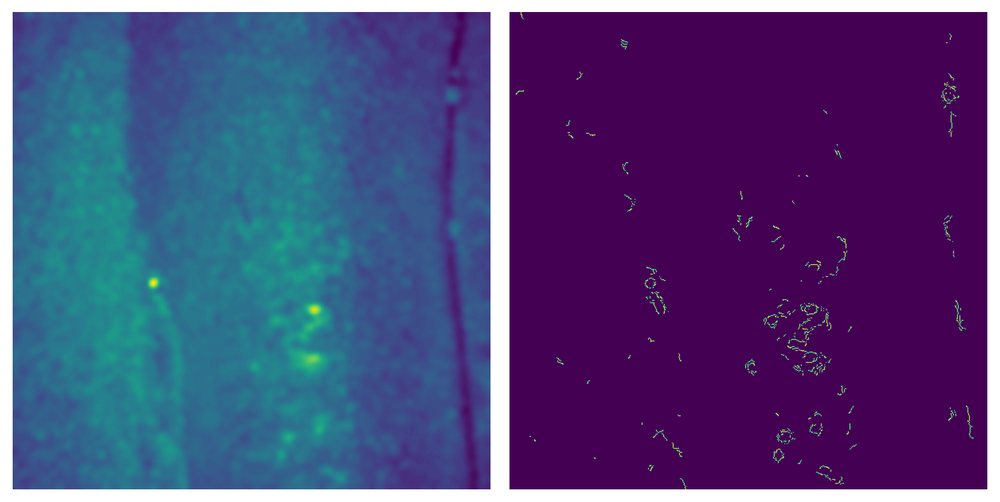

In [6]:
im2 = cv.imread('Images/Inputs/topview/VID_topview-0002.png', cv.IMREAD_GRAYSCALE)
roi2 = im2[250:850, 420:1020]
roi2_norm = cv.normalize(roi2, None, alpha=0, beta=255, norm_type=cv.NORM_MINMAX)
kernel = 15
sigma = 5

im2_blur = cv.GaussianBlur(roi2_norm, (kernel,kernel), sigma)
edge2 = cv.Canny(im2_blur, 8, 14)
funcs.comparer_duo(
    #roi_norm,
    im2_blur, 
    edge2,
        )

In [7]:
def crop_img(img, x1, x2, y1, y2):
    return img[y1:y2, x1:x2]

def norm_img(img, upper=255, lower=0):
    max = np.max(img)
    min = np.min(img)
    
    rows, cols = img.shape
    new_img = np.zeros_like(img)

    for i in range(rows):
        for j in range(cols):
            val = img.item(i, j)
            norm_val = (((val-min)/(max-min))*(upper-lower)) + lower
            new_img.itemset((i, j), norm_val)
    
    return new_img

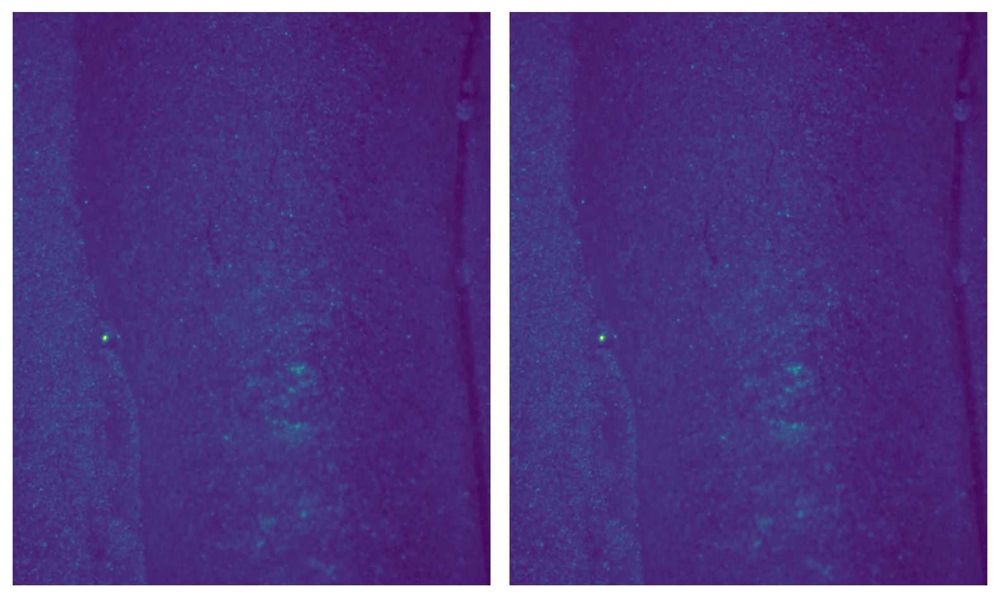

In [8]:
roi2 = crop_img(im2, 500, 1000, 250, 850)
roi2_norm = norm_img(roi2)

funcs.comparer_duo(roi2, roi2_norm)

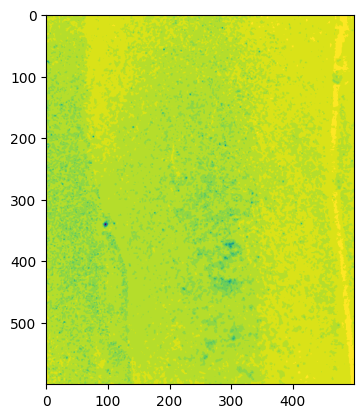

In [45]:
diff_img = cv.subtract(roi2, roi2_norm)
plt.imshow(diff_img)

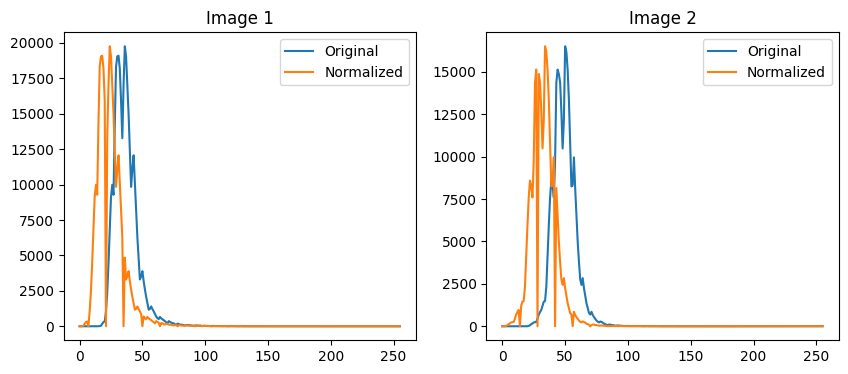

In [18]:
hist1 = cv.calcHist([roi1], [0], None, [256], [0, 256]) # image 1
hist2 = cv.calcHist([roi2], [0], None, [256], [0, 256]) # image 2
hist3 = cv.calcHist([roi1_norm], [0], None, [256], [0, 256]) # normed image 1
hist4 = cv.calcHist([roi2_norm], [0], None, [256], [0, 256]) # normed image 2


fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].set_title('Image 1')
ax[0].plot(hist1, label='Original')
ax[0].plot(hist3, label='Normalized')
ax[0].legend()
ax[1].set_title('Image 2')
ax[1].plot(hist2, label='Original')
ax[1].plot(hist4, label='Normalized')
ax[1].legend()




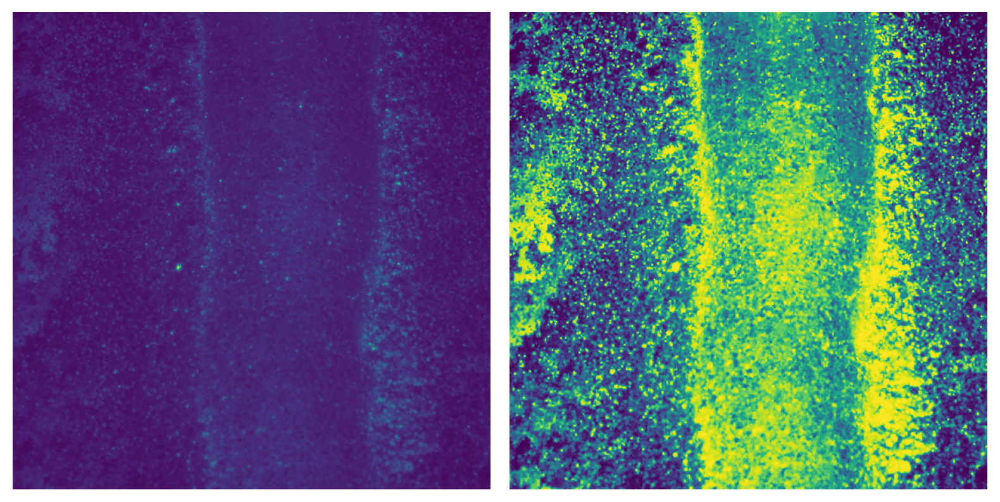

In [20]:
equ1 = cv.equalizeHist(roi1)
equ2 = cv.equalizeHist(roi2)
funcs.comparer_duo(roi1, equ1)

In [21]:
def cv_Canny(img, sigma, kernel_size, low_thresh, hi_thresh):
    img_blur = cv.GaussianBlur(img, dst=None, ksize=(kernel_size, kernel_size), sigmaX=sigma)
    img_canny = cv.Canny(img_blur, low_thresh, hi_thresh)
    return img_canny

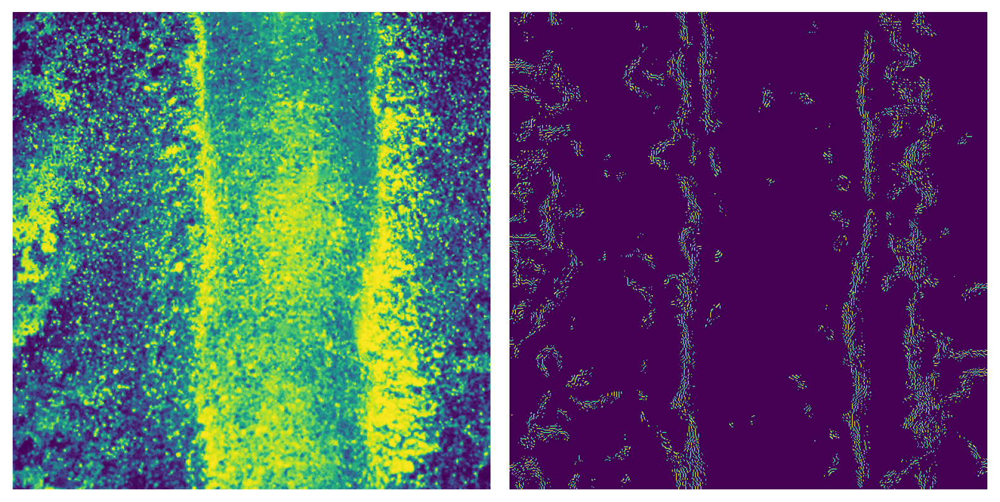

In [70]:
equ1_canny = cv_Canny(equ1, sigma=10, kernel_size=51, low_thresh=21, hi_thresh=21.5)
funcs.comparer_duo(equ1, equ1_canny)

In [73]:
vid = cv.VideoCapture('Vids/VID_topview.webm')
fourcc = cv.VideoWriter_fourcc(*'MP4V')
out = cv.VideoWriter('output2.mp4', fourcc, 30.0, (int(vid.get(3)), int(vid.get(4))), isColor=False)

if (vid.isOpened() == False):
    print("Error opening video stream or file")

while (vid.isOpened()):
    (ret, frame) = vid.read()
    if ret == True:
        #cv.imshow('Frame', frame) # show opened frame
        frame = frame[250:850, 420:1020] # crop
        frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
        frame = cv.equalizeHist(frame)
        frame = cv.GaussianBlur(frame, (51, 51), 10)
        edge = cv.Canny(frame, 21, 21.5)

        out.write(edge)
        cv.imshow('Edge Detection', edge)

    else:
        break


    if cv.waitKey(25) & 0xFF == ord('q'):
        break


vid.release()
out.release()

cv.waitKey(1)
cv.destroyAllWindows()
for i in range (1,5):
    cv.waitKey(1)

: 

In [16]:
slice = edge[400].flatten
window = 5

In [ ]:
smoother = n

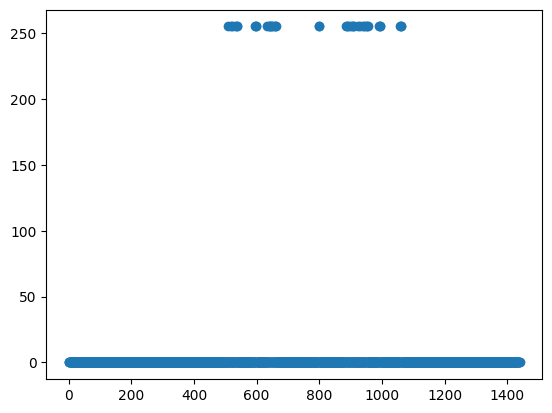

In [135]:
plt.scatter(x=np.arange(1440), y=edge[400].flatten())

In [133]:
plt.hist()

1440

In [134]:
np.arange(1400).size

1400